In [ ]:
# Importing relevant libraries:
import numpy as np
import pandas as pd

In [ ]:
# Loading dataset
from google.colab import drive
drive.mount('/content/drive')
# from: Wah, C., Branson, S., Welinder, P., Perona, P., & Belongie, S. (2022). CUB-200-2011 (1.0) [Data set]. CaltechDATA. https://doi.org/10.22002/D1.20098

Mounted at /content/drive


## Data Pre-Processing:

In [ ]:
path_loc = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/parts/part_locs.txt'
cols = ['idx', 'part', 'X', 'Y', 'vis']
df_parts = pd.read_csv(path_loc, sep=' ', header=None, names=cols)
df_parts.to_csv('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/parts/df_parts.csv')

In [ ]:
pt = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/parts/parts.txt'

sol = ['7 left_eye', '8 left_leg', '9 left_wing', '11 right_eye', '12 right_leg', '13 right_wing']
lines_c = []
with open(pt) as file:
  lines = [line.rstrip() for line in file]

  print(lines)
  for i in lines:
    id = 0
    if i.count(' ') > 1:
      i = sol[id]
      lines_c.append(i)
      id += 1
    else:
      lines_c.append(i)
with open('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/parts/legend.txt', 'w') as file:
      for line in lines_c:
        file.write(line + '\n')

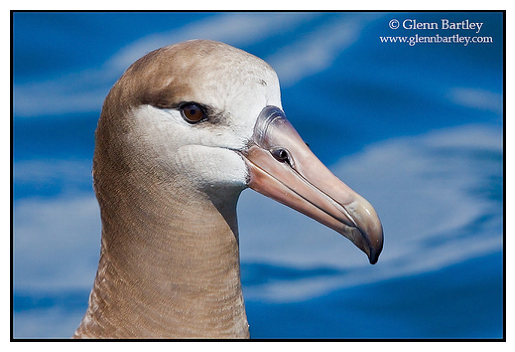

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
img_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images'
images = pd.read_csv('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images.txt', sep = ' ', header=None)
fi = os.path.join(img_path, images.iloc[0, 1])



img = Image.open(fi)

plt.imshow(img)
plt.axis('off')
plt.show()

In [ ]:
parts = pd.read_csv('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/parts/df_parts.csv')
parts.head()


,Unnamed: 0,idx,part,X,Y,vis
0,0,1,1,0.0,0.0,0
1,1,1,2,312.0,182.0,1
2,2,1,3,0.0,0.0,0
3,3,1,4,0.0,0.0,0
4,4,1,5,186.0,45.0,1


In [ ]:
# Analyse if there is any class imbalance:
import os
from collections import Counter

path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images'

class_counts = {}

for class_folder in os.listdir(path):
  class_folder_path = os.path.join(path, class_folder)
  if os.path.isdir(class_folder_path):
    num_img = len(os.listdir(class_folder_path))
    class_counts[class_folder] = num_img
for class_name, count in class_counts.items():
  print('Class: {} : {} images'.format(class_name, count))


In [ ]:
# check imabalces:
from scipy import stats

img_counts = list(class_counts.values())


In [ ]:
img_counts = np.array(img_counts)


mean_img = np.mean(img_counts)
std_img = np.std(img_counts)

print('Mean: {}, Standard Deviation: {}'.format(mean_img, std_img))

h_statistic, p_value = stats.kruskal(*[np.full((size,), i) for i, size in enumerate(img_counts)])
print('Kruskal-Wallis H-test result: {}, p-value = {}'.format(h_statistic, p_value))


Mean: 60.72, Standard Deviation: 7.366247348548649
Kruskal-Wallis H-test result: 12143.0, p-value = 0.0


In [ ]:
import matplotlib.pyplot as plt

counts = list(class_counts.values())

plt.figure(figsize=(15, 7))
# Create histogram with an appropriate number of bins; you can adjust this number as necessary
n_bins = min(len(set(counts)), 40)  # for example, choose fewer bins for better spacing
plt.hist(counts, bins=n_bins, edgecolor='black')

plt.xlabel('Number of images per class')
plt.ylabel('Number of classes')
plt.title('Class Distribution Histogram')

plt.xticks(range(0, max(counts) + 1, max(counts) // n_bins))
plt.show()

In [ ]:
plt.figure(figsize=(20, 10))  # Increased figure size
n_bins = 20  # Fewer bins
plt.hist(counts, bins=n_bins, edgecolor='black')

plt.xlabel('Number of images per class')
plt.ylabel('Number of classes')
plt.yscale('log')  # Logarithmic scale for the y-axis

# Custom x-axis labels to avoid crowding
plt.xticks([min(counts), np.median(counts), np.percentile(counts, 25), np.percentile(counts, 75), max(counts)])
plt.title('Class Distribution Histogram')
plt.show()

## CNN for image classification

In [ ]:
import torch
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn as nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, Subset, SubsetRandomSampler
import torchvision.models as models
from torch.cuda.amp import GradScaler, autocast
from torch.utils.data.dataset import Dataset
from sklearn.model_selection import StratifiedKFold
import numpy as np
from torch.utils.tensorboard import SummaryWriter
from torch.optim.lr_scheduler import ReduceLROnPlateau
import os
from collections import Counter
from PIL import Image
import numpy as np
import pandas as pd


images_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images.txt'
splits_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/train_test_split.txt'
class_labels_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/image_class_labels.txt'
classes_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/classes.txt'

# Load the text files into pandas DataFrames
images_df = pd.read_csv(images_path, sep=' ', names=['image_id', 'image_name'])
split_df = pd.read_csv(splits_path, sep=' ', names=['image_id', 'is_train'])
class_labels_df = pd.read_csv(class_labels_path, sep=' ', names=['image_id', 'class_id'])
classes_df = pd.read_csv(classes_path, sep=' ', names=['class_id', 'class_name'])

# Merge the DataFrames to associate each image with its class label and train/test split
merged_df = images_df.merge(split_df, on='image_id').merge(class_labels_df, on='image_id')

# Calculate class counts
class_counts = merged_df['class_id'].value_counts().to_dict()

train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(1.0, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(8),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class CustomDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = os.path.join('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images', self.df.iloc[idx]['image_name'])
        image = Image.open(img_path).convert('RGB')
        label = self.df.iloc[idx]['class_id'] - 1
        if self.transform:
            image = self.transform(image)
        return image, label


train_df = merged_df[merged_df['is_train'] == 1]
test_df = merged_df[merged_df['is_train'] == 0]

labels = train_df['class_id'].tolist()

# KFold cross-validation setup
k_folds = 5
stratified_kfold = StratifiedKFold(n_splits=k_folds, shuffle=True)

total_images = len(merged_df)
num_classes = len(class_counts)
class_weights = torch.tensor([total_images / (num_classes * class_counts[idx]) for idx in range(1, num_classes + 1)], dtype=torch.float32)

for fold, (train_ids, val_ids) in enumerate(stratified_kfold.split(np.zeros(len(labels)), labels)):
    print(f'FOLD {fold}')
    print('--------------------------------')

    train_subset = Subset(CustomDataset(train_df, transform=train_transforms), train_ids)
    val_subset = Subset(CustomDataset(train_df, transform=test_transforms), val_ids)




    train_loader = DataLoader(train_subset, batch_size=32, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_subset, batch_size=32, shuffle=False, num_workers=4)

    # Initialize the model for this fold
    model = models.resnet101(pretrained=True)
    num_ftrs = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(0.5), # maybe at 0.4, redo at 0.4, try one without linear layer
        nn.Linear(num_ftrs, 512),
        nn.ReLU(),
        nn.Linear(512, 200)

    )
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model.to(device)

# implement gridsearch with: lr, loss
    # Initialize optimizer, criterion, and scheduler

    optimizer = optim.SGD(model.parameters(), lr=0.008, momentum=0.9, weight_decay=1e-4)

    criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))

    scaler = GradScaler()
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=4, verbose=True)# try different scheduler


    num_epochs = 25 # 25 would be better
    global_step = 0

    for epoch in range(num_epochs):
      model.train()
      running_loss = 0.0
      running_corrects = 0

      for inputs, labels in train_loader:
          inputs = inputs.to(device)
          labels = labels.to(device)

          optimizer.zero_grad()

          # Use automatic mixed precision
          with autocast():
              outputs = model(inputs)
              loss = criterion(outputs, labels)

          _, preds = torch.max(outputs, 1)  # Calculate predictions here
          running_loss += loss.item() * inputs.size(0)
          running_corrects += torch.sum(preds == labels.data)
          #writer.add_scalar('Loss/train k={}'.format(fold), loss.item(), global_step)
          #writer.add_scalar('Accuracy/train, k={}'.format(fold), torch.sum(preds == labels.data) / inputs.size(0), global_step)

          global_step += 1

          scaler.scale(loss).backward()
          scaler.step(optimizer)
          scaler.update()




      train_loss = running_loss / len(train_subset)
      train_acc = running_corrects.double() / len(train_subset)

        # Validation phase
      model.eval()
      val_loss = 0.0
      val_corrects = 0

      with torch.no_grad():
            for inputs, labels in val_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                val_loss += loss.item() * inputs.size(0)
                val_corrects += torch.sum(preds == labels.data)
                #writer.add_scalar('Loss/val, k={}'.format(fold), loss.item(), global_step)
                #writer.add_scalar('Accuracy/val, k={}'.format(fold), torch.sum(preds == labels.data).item() / inputs.size(0), global_step)


      val_loss = val_loss / len(val_subset)
      val_acc = val_corrects.double() / len(val_subset)
      scheduler.step(val_loss)



      print(f'Epoch {epoch}/{num_epochs - 1} Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}')
      #writer.close()





torch.save(model.state_dict(), '/content/drive/MyDrive/my_model_{}.pth'.format('resenet101'))
# Evaluate on the test dataset

test_subset = CustomDataset(test_df, transform=test_transforms)

test_loader = DataLoader(test_subset, batch_size=32, shuffle=False, num_workers=4)
test_loss = 0.0
test_corrects = 0

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        test_corrects += torch.sum(preds == labels.data)

test_loss = test_loss / len(test_df)
test_acc = test_corrects.double() / len(test_df)
print(f'Test Loss: {test_loss:.4f} Acc: {test_acc:.4f}')





FOLD 0
--------------------------------


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:06<00:00, 26.6MB/s]


Epoch 0/24 Train Loss: 4.7535 Acc: 0.0488 Val Loss: 3.5109 Acc: 0.1543
Epoch 1/24 Train Loss: 2.8003 Acc: 0.2774 Val Loss: 2.7149 Acc: 0.3036
Epoch 2/24 Train Loss: 1.9589 Acc: 0.4417 Val Loss: 2.1403 Acc: 0.4137
Epoch 3/24 Train Loss: 1.5250 Acc: 0.5424 Val Loss: 2.0253 Acc: 0.4445
Epoch 4/24 Train Loss: 1.2432 Acc: 0.6156 Val Loss: 2.0227 Acc: 0.4570
Epoch 5/24 Train Loss: 1.1008 Acc: 0.6621 Val Loss: 1.9997 Acc: 0.4729
Epoch 6/24 Train Loss: 0.9407 Acc: 0.7078 Val Loss: 1.7102 Acc: 0.5346
Epoch 7/24 Train Loss: 0.7700 Acc: 0.7581 Val Loss: 1.7929 Acc: 0.5538
Epoch 8/24 Train Loss: 0.6430 Acc: 0.8004 Val Loss: 2.0043 Acc: 0.5221
Epoch 9/24 Train Loss: 0.6465 Acc: 0.7958 Val Loss: 2.3167 Acc: 0.4771
Epoch 10/24 Train Loss: 0.5567 Acc: 0.8257 Val Loss: 1.9577 Acc: 0.5304
Epoch 00012: reducing learning rate of group 0 to 8.0000e-04.
Epoch 11/24 Train Loss: 0.4885 Acc: 0.8486 Val Loss: 1.9088 Acc: 0.5580
Epoch 12/24 Train Loss: 0.2179 Acc: 0.9374 Val Loss: 1.3473 Acc: 0.6764
Epoch 13/24 

## Model building code used pytorch=> actual model:

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/plots_nlp


<IPython.core.display.Javascript object>

Different from v1 to v2:
  - dropout layer 0.5
  - optimiser with 'weights decay of: 1e-4
  - unfreezed the last four layers of resnet
  - add graphic of loss function

  - first model: final accuracy: 0.91, final val accurayc: 0.64

  - second model: 0.74 0.61
  
  
  Changes from v2 to v3: increase the num of epocs(16), unfreeze just 3 layers

  Changes from v3 (0.76, 0,62) to v4:
  - Dropout from 0.5 to 0.3, unfreezing 2 layers, num epochs around 10.

Results from v4: acc: 0.84, val acc=0.62
Next steps: unfreeze just 3 layers, dropout of 0.4, num epochs same, lr rate at 0.0005, batch size= 64 (before: 32)


from model 5 to 6: no unfrozen layers, batch size: 32, dropout: 0.3, lr=0.001

Difficulties: we can achieve very good results during the training phase, although, during the validation phase we are unable to obtain the same results=>overfitting

** Differences into the nith model:**
- we have added more layers to the pretrained model (dropout 0.4)
- Testing
- K-fold validation, data augmentation for training data
-

In [ ]:
! pip install torch

Test Loss : 1.0795888232969295, Acc: 0.7119433897134967


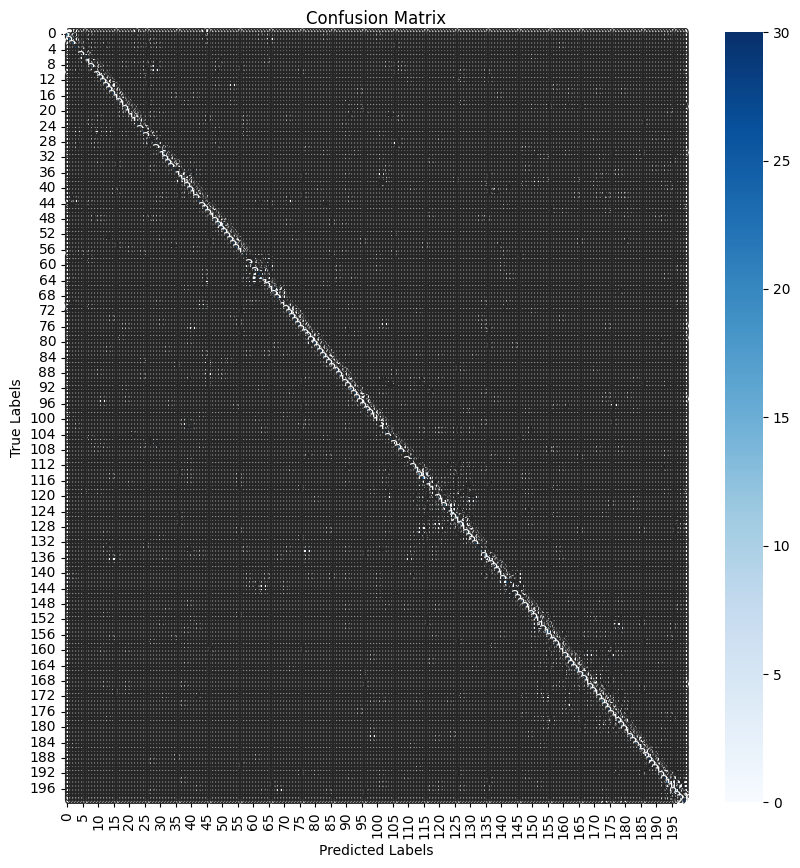

In [ ]:
# Re-test and Confusion Matrix:

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

model.eval()
test_loss = 0.0
test_corrects = 0

all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
      inputs = inputs.to(device)
      labels = labels.to(device)
      outputs = model(inputs)
      _, preds = torch.max(outputs, 1)
      loss = criterion(outputs, labels)

      test_loss += loss.item() * inputs.size(0)
      test_corrects += torch.sum(preds == labels.data)

      all_preds.extend(preds.view(-1).cpu().numpy())
      all_labels.extend(labels.view(-1).cpu().numpy())

test_loss = test_loss / len(test_subset)

test_acc = test_corrects.double() / len(test_subset)

print('Test Loss : {}, Acc: {}'.format(test_loss, test_acc))

conf_matrix = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(10, 10))

sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues')

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')

plt.show()


# Model Explainability with Captum:

In [ ]:
!pip install captum

### Starting:

In [ ]:
import torch
import torch.nn.functional as F

from PIL import Image

import os
import json
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

import torchvision
from torchvision import models
from torchvision import transforms

from captum.attr import IntegratedGradients
from captum.attr import GradientShap
from captum.attr import LRP
from captum.attr import Occlusion
from captum.attr import NoiseTunnel
from captum.attr import visualization as viz
from captum.attr._utils.lrp_rules import EpsilonRule, GammaRule, Alpha1_Beta0_Rule

In [ ]:
# Loading model:
import torch.nn as nn
model = models.resnet50(pretrained=False)
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(0.5),  # Match the dropout rate
    nn.Linear(num_ftrs, 512),  # Match the size of the first Linear layer
    nn.ReLU(),
    nn.Linear(512, 200)  # Match the size of the second Linear layer
)

for param in model.layer2.parameters():
    param.requires_grad = True
for param in model.fc.parameters():
    param.requires_grad = True
model.load_state_dict(torch.load('/content/drive/MyDrive/my_model_{}.pth'.format('resenet101'), map_location=torch.device('cpu')))
model.to(torch.device('cpu'))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
# normalise and transform image, loading image:
import os
import random
from PIL import Image
from torchvision import transforms

# Path to your main folder containing sub-folders
main_folder_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images'

# Randomly select a sub-folder
sub_folder_name = random.choice(os.listdir(main_folder_path))
sub_folder_path = os.path.join(main_folder_path, sub_folder_name)

# Randomly select an image from the sub-folder
image_name = random.choice(os.listdir(sub_folder_path))
image_path = os.path.join(sub_folder_path, image_name)

# Load and transform the image
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

img = Image.open(image_path)
transformed_img = transform(img)
input_img = transformed_img.unsqueeze(0)



In [ ]:
from torchvision import datasets
dataset = datasets.ImageFolder('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images', transform=transform)
idx_to_labels = {v: k for k, v in dataset.class_to_idx.items()}


In [ ]:
import torch.nn.functional as F

# Make sure idx_to_labels has keys starting from 0 to number of classes - 1
idx_to_labels = {v: k for k, v in dataset.class_to_idx.items()}

# Load your model (ensure it's in eval mode)
model.eval()

# Get the model prediction
with torch.no_grad():
    output = model(input_img)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)

# No need to subtract 1 here
predicted_label = idx_to_labels[pred_label_idx.item()]
print('Predicted:', predicted_label, '(', prediction_score.squeeze().item(), ')')

Predicted: 079.Belted_Kingfisher ( 0.9982404708862305 )


### Gradient-based attribution¶

In [ ]:
integrated_gradients = IntegratedGradients(model)
attributions_ig = integrated_gradients.attribute(input_img, target=pred_label_idx, n_steps=50)

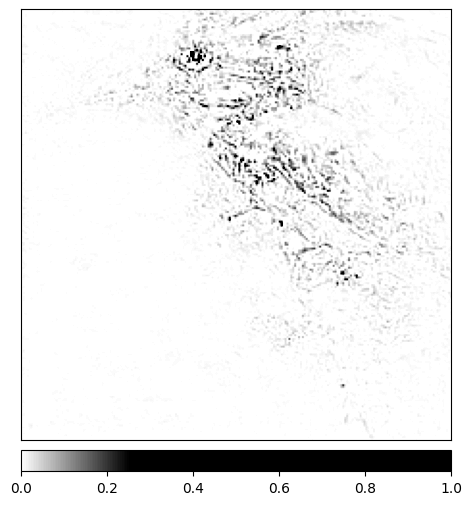

In [ ]:
default_cmap = LinearSegmentedColormap.from_list('custom blue',
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)

_ = viz.visualize_image_attr(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
                             np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                             method='heat_map',
                             cmap=default_cmap,
                             show_colorbar=True,
                             sign='positive',
                             outlier_perc=1)

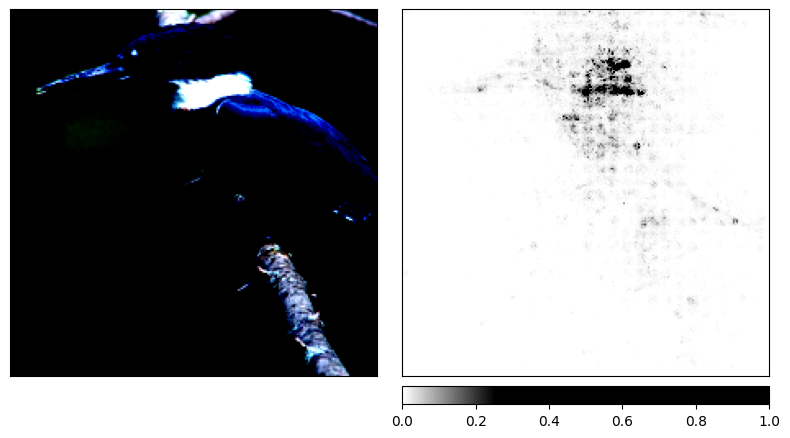

In [ ]:
noise_tunnel = NoiseTunnel(integrated_gradients)

attributions_ig_nt = noise_tunnel.attribute(input_img, nt_samples=10, nt_type='smoothgrad_sq', target=pred_label_idx)
_ = viz.visualize_image_attr_multiple(np.transpose(attributions_ig_nt.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      cmap=default_cmap,
                                      show_colorbar=True)

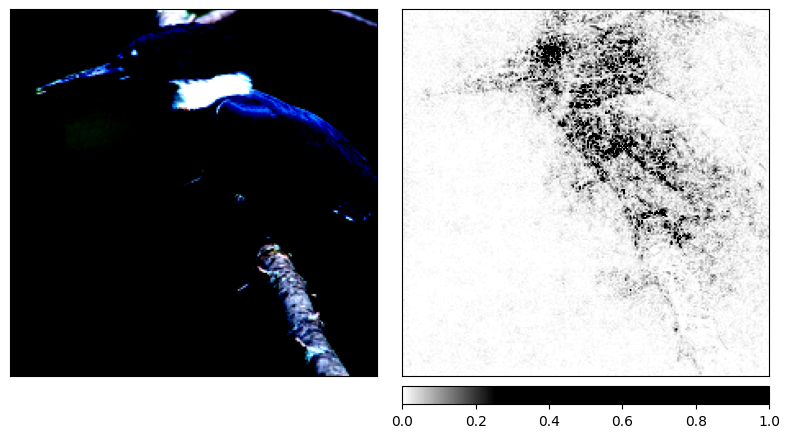

In [ ]:
import torch
import numpy as np
from captum.attr import GradientShap
from captum.attr import visualization as viz

model.eval()

# Set manual seeds for reproducibility
torch.manual_seed(0)
np.random.seed(0)


gradient_shap = GradientShap(model)

input = transformed_img.unsqueeze(0)


rand_img_dist = torch.cat([input * 0, input * 1], dim=0)

attributions_gs = gradient_shap.attribute(input,
                                          n_samples=50,
                                          stdevs=0.0001,
                                          baselines=rand_img_dist,
                                          target=pred_label_idx)


_ = viz.visualize_image_attr_multiple(np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "absolute_value"],
                                      cmap=default_cmap,
                                      show_colorbar=True)

### Occlusion-based attribution¶

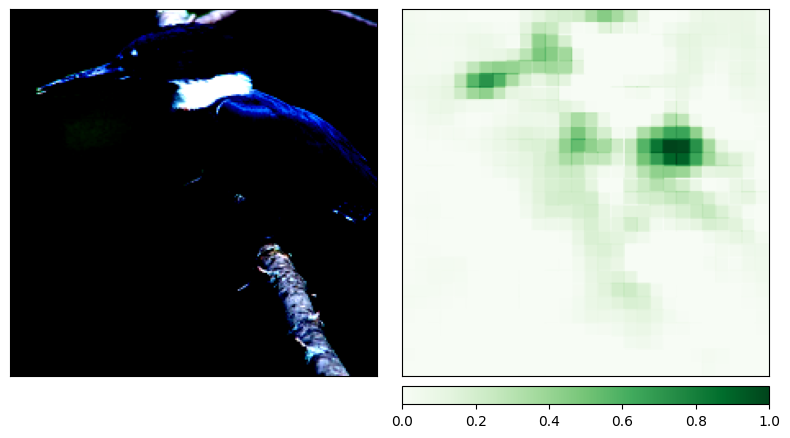

In [ ]:
import torch
import torch.nn.functional as F
from captum.attr import Occlusion


model.eval()


with torch.no_grad():
    output = model(input_img)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)


target_class = pred_label_idx.item()


occlusion = Occlusion(model)


baselines = input_img * 0

attributions_occ = occlusion.attribute(input_img,
                                       strides=(3, 8, 8),
                                       target=target_class,
                                       sliding_window_shapes=(3, 15, 15),
                                       baselines=baselines)

_ = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2)


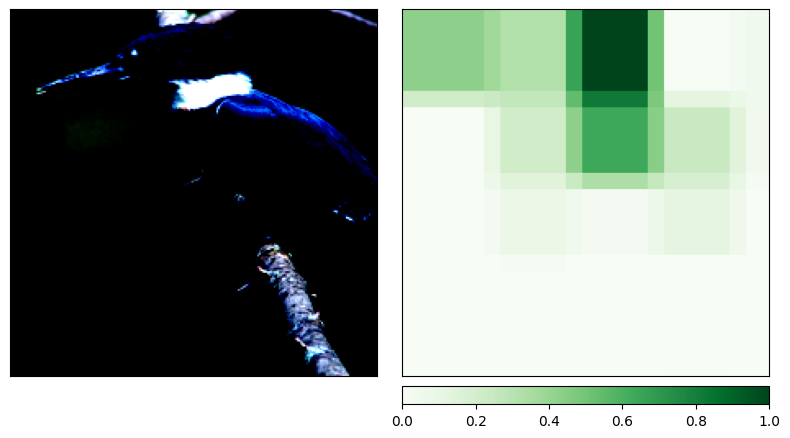

In [ ]:
occlusion = Occlusion(model)

attributions_occ = occlusion.attribute(input,
                                       strides = (3, 50, 50),
                                       target=pred_label_idx,
                                       sliding_window_shapes=(3,60, 60),
                                       baselines=0)

_ = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2)

### LRP-based attribution

In [ ]:

model.eval()
lrp = LRP(model)

attributions_lrp = lrp.attribute(input,
                                target=pred_label_idx)

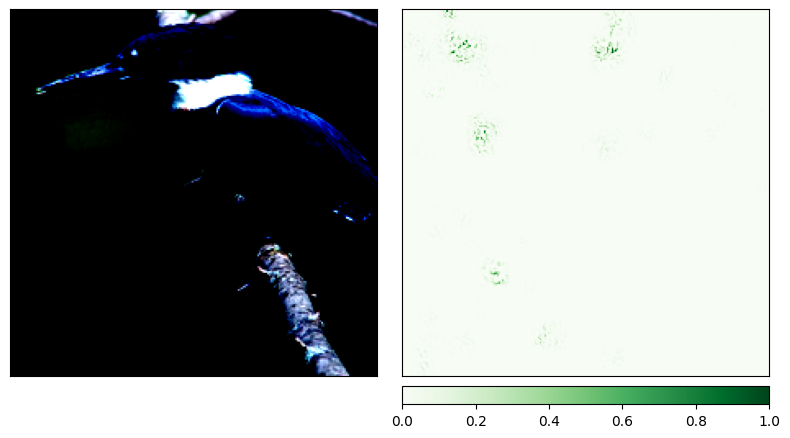

In [ ]:
_ = viz.visualize_image_attr_multiple(np.transpose(attributions_lrp.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2)

In [ ]:
layers = []

layers.append(model.conv1)
layers.append(model.bn1)
layers.append(model.relu)
layers.append(model.maxpool)


layers.extend([*model.layer1, *model.layer2, *model.layer3, *model.layer4])


layers.extend([*model.fc])

num_layers = len(layers)

for layer in layers:
    if isinstance(layer, nn.Conv2d):
        setattr(layer, "rule", GammaRule())
    elif isinstance(layer, nn.Linear):
        setattr(layer, "rule", EpsilonRule())

lrp = LRP(model)
attributions_lrp = lrp.attribute(input,
                                target=pred_label_idx)

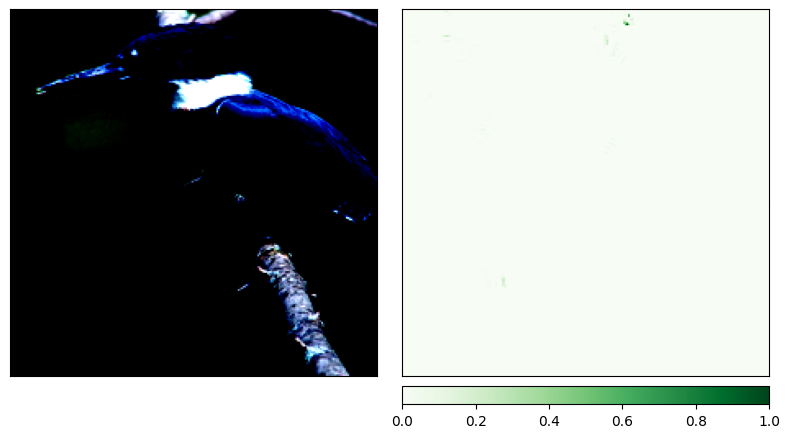

In [ ]:
_ = viz.visualize_image_attr_multiple(np.transpose(attributions_lrp.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2)

### Feature Abaltion:

In [ ]:
from captum.attr import FeatureAblation



with torch.no_grad():
    output = model(input_img)
    output = F.softmax(output, dim=1)
    prediction_score, pred_label_idx = torch.topk(output, 1)


feature_ablation = FeatureAblation(model)


target_class = pred_label_idx.item()


attributions_fa = feature_ablation.attribute(input_img, target=target_class)


import matplotlib.pyplot as plt
from captum.attr import visualization as viz


attributions_fa_np = attributions_fa.squeeze().cpu().detach().numpy().transpose(1, 2, 0)


_ = viz.visualize_image_attr(attributions_fa_np,
                             np.transpose(input_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                             method="heat_map",
                             sign="absolute_value",
                             show_colorbar=True,
                             title="Feature Ablations")


KeyboardInterrupt: 

### Quantitive Analysis:

In [ ]:
! pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 6.4 MB/s eta 0:00:00


In [ ]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image


def show_image_with_bbox(image_path, bbox, target_size=(224, 224)):
    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize image
    image = cv2.resize(image, target_size)


    cv2.rectangle(image, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 2)

    # Display image with bounding box
    plt.imshow(image)
    plt.axis('off')
    plt.show()

In [ ]:
def show_gradient_attribution(image_path, attribution):
    # Load image
    image = Image.open(image_path)
    image = image.resize((224, 224)) # Resize if necessary
    image = np.array(image)
    attribution = attribution.squeeze().cpu().detach().numpy()
    attribution = np.abs(attribution)
    attribution = np.sum(attribution, axis=0)
    attribution = attribution / np.max(attribution)

# Convert to 8-bit unsigned integer
    heatmap = np.uint8(255 * attribution)

# Apply color map
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# Superimpose the heatmap on original image
    superimposed_img = heatmap * 0.4 + image
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

# Display
    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.show()

In [ ]:
def show_bbox_with_gradient(image_path, bbox, attribution):

    image = Image.open(image_path)
    image = image.resize((224, 224))
    image = np.array(image)


    attribution = attribution.squeeze().cpu().detach().numpy()
    attribution = np.abs(attribution)


    if attribution.ndim == 3:
        attribution = np.sum(attribution, axis=0)


    attribution = attribution / np.max(attribution)
    heatmap = np.uint8(255 * attribution)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    superimposed_img = heatmap * 0.4 + image
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)


    superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_RGB2BGR)


    cv2.rectangle(superimposed_img, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 255, 0), 2)


    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

In [ ]:
# try to see how does it look:
import pandas as pd
import random
images_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images.txt'
splits_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/train_test_split.txt'
class_labels_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/image_class_labels.txt'
classes_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/classes.txt'


images_df = pd.read_csv(images_path, sep=' ', names=['image_id', 'image_name'])
split_df = pd.read_csv(splits_path, sep=' ', names=['image_id', 'is_train'])
class_labels_df = pd.read_csv(class_labels_path, sep=' ', names=['image_id', 'class_id'])
classes_df = pd.read_csv(classes_path, sep=' ', names=['class_id', 'class_name'])


merged_df = images_df.merge(split_df, on='image_id').merge(class_labels_df, on='image_id')
test_df = merged_df[merged_df['is_train'] == 0]


In [ ]:
bbox_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/bounding_boxes.txt'
bbox_df = pd.read_csv(bbox_path, sep=' ', names=['image_id', 'x', 'y', 'width', 'height'])


test_df_with_bbox = test_df.merge(bbox_df, on='image_id')


random_row = test_df_with_bbox.sample(n=1).iloc[0]

# Retrieve the image path and bounding box
image_name = random_row['image_name']
image_path = f'/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images/{image_name}'

# Adjust bounding box to (x_min, y_min, x_max, y_max)
x_min = int(random_row['x'])
y_min = int(random_row['y'])
x_max = x_min + int(random_row['width'])
y_max = y_min + int(random_row['height'])
bbox = [x_min, y_min, x_max, y_max]

In [ ]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from captum.attr import IntegratedGradients
from PIL import Image

# Define the model architecture
model = models.resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(num_ftrs, 512),
    nn.ReLU(),
    nn.Linear(512, 200)
)

# Load the trained model weights
model_path = '/content/drive/MyDrive/my_model_{}.pth'.format('resenet101')
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model.eval()

# Image preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model input
    transforms.ToTensor(),
    # Include any additional normalization or transformation used during training
])

image = Image.open(image_path)
input_img = transform(image).unsqueeze(0)  # Add batch dimension

# Predict the image
output = model(input_img)
prediction = output.argmax(dim=1).item()

# Initialize Integrated Gradients
ig = IntegratedGradients(model)

# Calculate attributions
attributions = ig.attribute(input_img, target=prediction)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


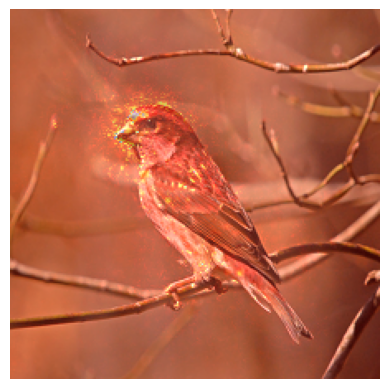

In [ ]:
# Show image with gradient attribution
import numpy as np

show_gradient_attribution(image_path, attributions)

In [ ]:
from PIL import Image

def scale_bbox_to_image(bbox, original_size, target_size=(224, 224)):
    """
    Scale the bounding box coordinates to match the resized image.

    Args:
    - bbox (tuple): Original bounding box (x_min, y_min, x_max, y_max).
    - original_size (tuple): Original size of the image (width, height).
    - target_size (tuple): Target size of the image, default is (224, 224).

    Returns:
    - scaled_bbox (tuple): Scaled bounding box coordinates.
    """
    scale_x = target_size[0] / original_size[0]
    scale_y = target_size[1] / original_size[1]

    x_min, y_min, x_max, y_max = bbox
    x_min_scaled = int(x_min * scale_x)
    y_min_scaled = int(y_min * scale_y)
    x_max_scaled = int(x_max * scale_x)
    y_max_scaled = int(y_max * scale_y)

    return (x_min_scaled, y_min_scaled, x_max_scaled, y_max_scaled)
#

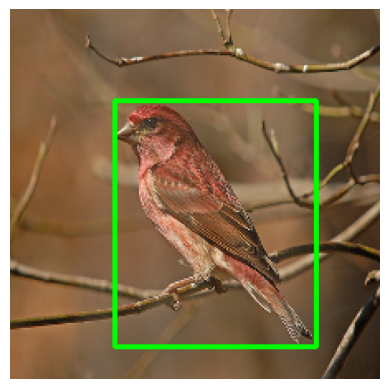

In [ ]:
show_image_with_bbox(image_path, scaled_bbox)

In [ ]:
scaled_bbox = expand_bbox(scaled_bbox, expand_percent=0.15)

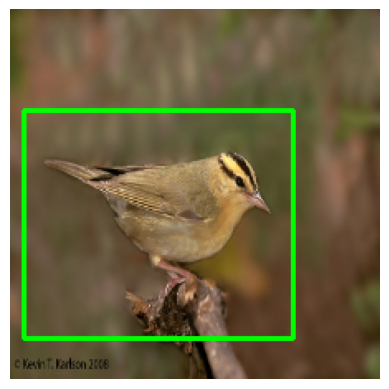

In [ ]:
show_image_with_bbox(image_path, scaled_bbox)

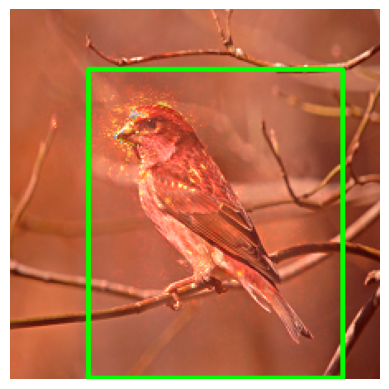

In [ ]:
show_bbox_with_gradient(image_path, scaled_bbox, attributions)

In [ ]:
def expand_bbox(bbox, expand_percent=0.1):
    """
    Expand the bounding box by a certain percentage.

    Args:
    - bbox (tuple): Original bounding box (x_min, y_min, x_max, y_max).
    - expand_percent (float): Percentage by which to expand the bbox.

    Returns:
    - expanded_bbox (tuple): Expanded bounding box coordinates.
    """
    x_min, y_min, x_max, y_max = bbox
    width = x_max - x_min
    height = y_max - y_min

    expand_width = width * expand_percent
    expand_height = height * expand_percent

    # Ensure new bbox does not go out of image boundaries
    new_x_min = max(0, x_min - int(expand_width / 2))
    new_y_min = max(0, y_min - int(expand_height / 2))
    new_x_max = min(224, x_max + int(expand_width / 2))  # Assuming image size is 224x224
    new_y_max = min(224, y_max + int(expand_height / 2))

    return (new_x_min, new_y_min, new_x_max, new_y_max)

In [ ]:
# calculate the percentage of gradients inside:
def calculate_gradients_percentage_in_box(attribution, bbox):
    """
    Calculate the percentage of gradients within the bounding box compared to the total.

    Args:
    - attribution (PyTorch tensor or numpy array): The gradient attribution map.
    - bbox (tuple): The bounding box coordinates (x_min, y_min, x_max, y_max).

    Returns:
    - percentage (float): The percentage of gradients within the bounding box.
    """

    if torch.is_tensor(attribution):
        attribution = attribution.squeeze().cpu().detach().numpy()


    if attribution.ndim == 3:
        attribution = np.sum(attribution, axis=0)


    attribution = np.abs(attribution)


    bbox_sum = np.sum(attribution[bbox[1]:bbox[3], bbox[0]:bbox[2]])


    total_sum = np.sum(attribution)


    percentage = (bbox_sum / total_sum) * 100 if total_sum > 0 else 0
    return percentage

In [ ]:
calculate_gradients_percentage_in_box(attributions, scaled_bbox)

83.6166769876669

In [ ]:
# Define the model architecture
import torch
import torch.nn as nn
from torchvision import models, transforms
from captum.attr import IntegratedGradients
from PIL import Image
model = models.resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(0.5),  # Adjust dropout as needed
    nn.Linear(num_ftrs, 512),
    nn.ReLU(),
    nn.Linear(512, 200)  # Assuming 200 classes
)

# Load the trained model weights
model_path = '/content/drive/MyDrive/my_model_{}.pth'.format('opt_split1')
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))


# Loading model for baseline:
untrained_model = models.resnet50(pretrained=False)
untrained_model.fc = nn.Sequential(nn.Linear(untrained_model.fc.in_features, 200))

base_model = models.resnet50(pretrained=True)
base_model.fc = nn.Sequential(nn.Linear(base_model.fc.in_features, 200))

model.eval()
untrained_model.eval()
base_model.eval()

In [ ]:
from scipy import stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np




samples = test_df_with_bbox.sample(n=600)
# saving the sample df for later

samples.to_csv('/content/drive/MyDrive/sampled_data.csv', index=False)

percentages_trained_model = []
percentages_untrained = []
percentages_base = []

for index, row in samples.iterrows():
  # get img
  image_name = row['image_name']
  image_path = f'/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images/{image_name}'

  # get bounding box:
  x_min = int(row['x'])
  y_min = int(row['y'])
  x_max = x_min + int(row['width'])
  y_max = y_min + int(row['height'])
  bbox = [x_min, y_min, x_max, y_max]
  image = Image.open(image_path)

  x, y = image.size
  original_size = (x, y)

  scaled_bbox = scale_bbox_to_image(bbox, original_size)






  transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),  # Ensure the image has 3 channels
    transforms.ToTensor(),
  ])



  image = Image.open(image_path).convert('RGB')  # Ensure the image is in RGB format

  input_img = transform(image).unsqueeze(0)


  if input_img.shape[1] != 3:

    continue

  output = model(input_img)
  output_untrained = untrained_model(input_img)
  output_baseline = base_model(input_img)

  prediction_untrained = output_untrained.argmax(dim=1).item()
  prediction_baseline = output_baseline.argmax(dim=1).item()
  prediction = output.argmax(dim=1).item()


  ig = IntegratedGradients(model)
  ig_untrained = IntegratedGradients(untrained_model)
  ig_base = IntegratedGradients(base_model)


  attributions = ig.attribute(input_img, target=prediction)
  attributions_untrained = ig_untrained.attribute(input_img, target=prediction_untrained)
  attributions_base = ig_base.attribute(input_img, target=prediction_baseline)







  perct = calculate_gradients_percentage_in_box(attributions, scaled_bbox)
  percentages_trained_model.append(perct)

  percent_untrained = calculate_gradients_percentage_in_box(attributions_untrained, scaled_bbox)
  percentages_untrained.append(percent_untrained)

  percent_base = calculate_gradients_percentage_in_box(attributions_base, scaled_bbox)
  percentages_base.append(percent_base)








percentages_trained_model = np.array(percentages_trained_model)
percentages_untrained = np.array(percentages_untrained)
percentages_base = np.array(percentages_base)

print('Average Gradients attribution trained model: {}% std: {}, median:{}'.format(np.mean(percentages_trained_model), np.std(percentages_trained_model),np.median(percentages_trained_model)))
print('Average Gradients attribution untrained model: {}% std: {}, median: {}'.format(np.mean(percentages_untrained), np.std(percentages_untrained), np.median(percentages_untrained)))
print('Average Gradients attribution base model: {}% std: {}, median:{}'.format(np.mean(percentages_base), np.std(percentages_base), np.median(percentages_base)))

data_to_save = samples[['image_name', 'x', 'y', 'width', 'height']].copy()
data_to_save['percentages_trained_model'] = percentages_trained_model
data_to_save['percentages_untrained'] = percentages_untrained
data_to_save['percentages_base'] = percentages_base


data_to_save.to_csv('/content/drive/MyDrive/gradient_attributions.csv', index=False)


# comparing the means:
all_percentages = np.concatenate([percentages_trained_model, percentages_untrained, percentages_base])
labels = np.array(['Trained'] * len(percentages_trained_model) +
                  ['Untrained'] * len(percentages_untrained) +
                  ['Baseline'] * len(percentages_base))

# ANOVA Test
f_value, p_value = stats.f_oneway(percentages_trained_model, percentages_untrained, percentages_base)
print(f'ANOVA Test: F-Value={f_value}, P-Value={p_value}')

# If P-Value is significant, proceed with Tukey's HSD
if p_value < 0.05:
    tukey_results = pairwise_tukeyhsd(endog=all_percentages, groups=labels, alpha=0.05)
    print(tukey_results)


Average Gradients attribution trained model: 60.65557165628731% std: 17.951597005818556, median:61.85348731268837
Average Gradients attribution untrained model: 39.700974382456664% std: 19.630067048009455, median: 36.032999270306796
Average Gradients attribution base model: 44.01727007919763% std: 18.68079977793333, median:42.39549037785317
ANOVA Test: F-Value=208.22091109970373, P-Value=4.653171657434125e-82
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1    group2  meandiff p-adj   lower    upper  reject
----------------------------------------------------------
Baseline   Trained  16.6383    0.0  14.0947 19.1819   True
Baseline Untrained  -4.3163 0.0002  -6.8599 -1.7727   True
 Trained Untrained -20.9546    0.0 -23.4982 -18.411   True
----------------------------------------------------------


In [ ]:
# Check the percentage of image occupied by the bounding box
data = pd.read_csv('/content/drive/MyDrive/gradient_attributions.csv')

In [ ]:
from PIL import Image
percentages_box = []

for index, row in data.iterrows():
  area = 224 * 224
  path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images/' + row['image_name']
  image = Image.open(path)
  x, y = image.size
  original_size = (x, y)
  widht = row['width']
  height = row['height']

  scale_w = 224 / original_size[0]
  scale_y = 224 / original_size[1]

  widht = widht * scale_w
  height = height * scale_y

  box_area = widht * height

  percentage = box_area / area
  percentages_box.append(percentage)


percentages_box = np.array(percentages_box)
print('Average size of the box compared to the tot img:{}, std:{}'.format(np.mean(percentages_box), np.std(percentages_box)))

Average size of the box compared to the tot img:0.3397087657844678, std:0.17829868801084198


In [ ]:
class_df = pd.read_csv('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/image_class_labels.txt', sep = ' ', names=['image_id', 'class'])
images_df = pd.read_csv('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images.txt', sep=' ', names=['image_id', 'image_name'])


merged_df = data.merge(images_df, on='image_name')

In [ ]:
merged_df_c = merged_df.merge(class_df, on='image_id')

In [ ]:
merged_df_c.head()

,image_name,x,y,width,height,percentages_trained_model,percentages_untrained,percentages_base,image_id,class
0,048.European_Goldfinch/European_Goldfinch_0108...,130.0,82.0,114.0,130.0,14.001887,9.229977,9.255902,2760,48
1,115.Brewer_Sparrow/Brewer_Sparrow_0067_107480.jpg,115.0,84.0,146.0,146.0,49.575733,27.159928,36.104485,6724,115
2,152.Blue_headed_Vireo/Blue_Headed_Vireo_0105_1...,102.0,163.0,222.0,269.0,63.025442,40.293697,59.496862,8895,152
3,139.Scarlet_Tanager/Scarlet_Tanager_0112_13869...,97.0,48.0,253.0,282.0,73.007736,51.372348,57.114420,8150,139
4,076.Dark_eyed_Junco/Dark_Eyed_Junco_0031_66785...,158.0,43.0,299.0,320.0,74.775110,49.285809,51.430427,4397,76


In [ ]:
import torch
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn as nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, Subset, SubsetRandomSampler
import torchvision.models as models
from torch.cuda.amp import GradScaler, autocast
from torch.utils.data.dataset import Dataset
from sklearn.model_selection import StratifiedKFold
import numpy as np
from torch.utils.tensorboard import SummaryWriter
from torch.optim.lr_scheduler import ReduceLROnPlateau
import os
from collections import Counter
from PIL import Image
import numpy as np
import pandas as pd


In [ ]:
test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class CustomDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = os.path.join('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images', self.df.iloc[idx]['image_name'])
        image = Image.open(img_path).convert('RGB')
        label = self.df.iloc[idx]['class'] -1
        if self.transform:
            image = self.transform(image)
        return image, label

In [ ]:
# is there correlation between gradient within the bounding box and accuracy?
test_subset = CustomDataset(merged_df_c, transform=test_transforms)

test_loader = DataLoader(test_subset, batch_size=32, shuffle=False, num_workers=4)

# Dictionary to store accuracies
# Dictionary to store accuracies
models = {'trained': model, 'untrained': untrained_model, 'base': base_model}
accuracies = {}
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dictionary to store individual accuracies
individual_accuracies = {model_name: [] for model_name in models.keys()}

for model_name, model in models.items():
    model.to(device).eval()
    test_corrects = 0
    total_images = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            corrects = preds == labels
            test_corrects += corrects.sum().item()
            total_images += labels.size(0)
            individual_accuracies[model_name].extend(corrects.cpu().numpy())

            # Debug: Print the first few predictions and actual labels
            if total_images <= 32:  # Adjust this number as needed
                print(f"Model: {model_name}, Batch: {total_images}")
                print(f"Predictions: {preds}")
                print(f"Actual Labels: {labels}")

    test_acc = test_corrects / total_images
    accuracies[model_name] = test_acc
    print(f'{model_name} - Accuracy: {test_acc:.4f}')

# Add individual accuracies to the DataFrame
for model_name, acc_list in individual_accuracies.items():
    merged_df_c[f'{model_name}_accuracy'] = acc_list


Model: trained, Batch: 32
Predictions: tensor([ 91,  85,  85, 135, 102,  85,  85,  85,  85,  85, 158,  85, 159,  85,
         56,  85,  85,  96,  85,  85,  85, 102,  91,  85,  29,  85,  85,  85,
        135,  85,  29,  91])
Actual Labels: tensor([ 48, 115, 152, 139,  76,  18,   9,  30, 153, 184, 124, 123,  69,  54,
        144, 166,  19, 161, 173, 181, 197, 182, 185,  15,  76, 152, 122,   5,
         68, 181,  68, 188])
trained - Accuracy: 0.0033
Model: untrained, Batch: 32
Predictions: tensor([63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63,
        63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63])
Actual Labels: tensor([ 48, 115, 152, 139,  76,  18,   9,  30, 153, 184, 124, 123,  69,  54,
        144, 166,  19, 161, 173, 181, 197, 182, 185,  15,  76, 152, 122,   5,
         68, 181,  68, 188])
untrained - Accuracy: 0.0033
Model: base, Batch: 32
Predictions: tensor([ 91,  85,  85, 135, 102,  85,  85,  85,  85,  85, 158,  85, 159,  85,
         56,  85,  8

In [ ]:
merged_df_c.head()

,image_name,x,y,width,height,percentages_trained_model,percentages_untrained,percentages_base,image_id,class
0,048.European_Goldfinch/European_Goldfinch_0108...,130.0,82.0,114.0,130.0,14.001887,9.229977,9.255902,2760,48
1,115.Brewer_Sparrow/Brewer_Sparrow_0067_107480.jpg,115.0,84.0,146.0,146.0,49.575733,27.159928,36.104485,6724,115
2,152.Blue_headed_Vireo/Blue_Headed_Vireo_0105_1...,102.0,163.0,222.0,269.0,63.025442,40.293697,59.496862,8895,152
3,139.Scarlet_Tanager/Scarlet_Tanager_0112_13869...,97.0,48.0,253.0,282.0,73.007736,51.372348,57.114420,8150,139
4,076.Dark_eyed_Junco/Dark_Eyed_Junco_0031_66785...,158.0,43.0,299.0,320.0,74.775110,49.285809,51.430427,4397,76


In [ ]:
# Assuming the columns are named 'trained_accuracy', 'untrained_accuracy', and 'base_accuracy'
columns_to_drop = ['trained_accuracy', 'untrained_accuracy', 'base_accuracy']

# Drop these columns from the DataFrame
merged_df_c = merged_df_c.drop(columns=columns_to_drop, errors='ignore')

# Now 'merged_df_c' is cleaned of the old accuracy columns and you can add new ones


### stat analysis


In [ ]:
import torch
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn as nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split, Subset, SubsetRandomSampler
import torchvision.models as models
from torch.cuda.amp import GradScaler, autocast
from torch.utils.data.dataset import Dataset
from sklearn.model_selection import StratifiedKFold
import numpy as np
from torch.utils.tensorboard import SummaryWriter
from torch.optim.lr_scheduler import ReduceLROnPlateau
import os
from collections import Counter
from PIL import Image
import numpy as np
import pandas as pd


images_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images.txt'
splits_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/train_test_split.txt'
class_labels_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/image_class_labels.txt'
classes_path = '/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/classes.txt'


images_df = pd.read_csv(images_path, sep=' ', names=['image_id', 'image_name'])
split_df = pd.read_csv(splits_path, sep=' ', names=['image_id', 'is_train'])
class_labels_df = pd.read_csv(class_labels_path, sep=' ', names=['image_id', 'class_id'])
classes_df = pd.read_csv(classes_path, sep=' ', names=['class_id', 'class_name'])

merged_df = images_df.merge(split_df, on='image_id').merge(class_labels_df, on='image_id')

class_counts = merged_df['class_id'].value_counts().to_dict()

# Define your transformations
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(1.0, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(8),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class CustomDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = os.path.join('/content/drive/MyDrive/NLP II/CUB_200_2011/CUB_200_2011/images', self.df.iloc[idx]['image_name'])
        image = Image.open(img_path).convert('RGB')
        label = self.df.iloc[idx]['class_id'] - 1
        if self.transform:
            image = self.transform(image)
        return image, label


train_df = merged_df[merged_df['is_train'] == 1]
test_df = merged_df[merged_df['is_train'] == 0]

# Convert class labels to a list for stratified split
labels = train_df['class_id'].tolist()



total_images = len(merged_df)
num_classes = len(class_counts)
class_weights = torch.tensor([total_images / (num_classes * class_counts[idx]) for idx in range(1, num_classes + 1)], dtype=torch.float32)

In [ ]:
filtered_df = test_df[test_df['image_id'].isin(merged_df_c['image_id'])]

In [ ]:
test_df = filtered_df

In [ ]:
test_subset = CustomDataset(test_df, transform=test_transforms)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))

test_loader = DataLoader(test_subset, batch_size=32, shuffle=False, num_workers=4)
test_loss = 0.0
test_corrects = 0
models = {'trained': model, 'untrained': untrained_model, 'base': base_model}
accuracies = {}
for key, model in models.items():
  model.eval()
  with torch.no_grad():
      for inputs, labels in test_loader:
          inputs = inputs.to(device)
          labels = labels.to(device)
          outputs = model(inputs)
          _, preds = torch.max(outputs, 1)
          loss = criterion(outputs, labels)
          test_loss += loss.item() * inputs.size(0)
          test_corrects += torch.sum(preds == labels.data)

  test_loss = test_loss / len(test_df)
  test_acc = test_corrects.double() / len(test_df)
  print(f'Test Loss {key}: {test_loss:.4f} Acc: {test_acc:.4f}')

Test Loss trained: 1.2582 Acc: 0.7000
Test Loss untrained: 24.7592 Acc: 0.7033
Test Loss base: 5.3961 Acc: 0.7100
